______
______
# PyViz 

http://pyviz.org/

______
______




______
______

## Datashader
______
______




Datashader is part of the PyViz initiative for making Python-based visualization tools work well together. 

- http://datashader.org/index.html 
- Datashader is supported and mantained by Anaconda 
> !conda install datashader


<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#PyViz" data-toc-modified-id="PyViz-1">PyViz</a></span><ul class="toc-item"><li><span><a href="#Datashader" data-toc-modified-id="Datashader-1.1">Datashader</a></span></li><li><span><a href="#US-Census" data-toc-modified-id="US-Census-1.2">US Census</a></span></li><li><span><a href="#NYC-Crime" data-toc-modified-id="NYC-Crime-1.3">NYC Crime</a></span></li></ul></li><li><span><a href="#END" data-toc-modified-id="END-2">END</a></span></li></ul></div>

## US Census

In [2]:
import datashader as ds
import datashader.transfer_functions as tf
import dask.dataframe as dd
import numpy as np

In [3]:
df = dd.io.parquet.read_parquet('/Users/datalab/bigdata/census.snappy.parq')
df = df.persist()

In [4]:
df.head()

,easting,northing,race
0,-13700737.0,6275190.0,w
1,-13700711.0,6275195.0,w
2,-13702081.0,6274898.5,w
3,-13701948.0,6274931.0,w
4,-13701793.0,6275088.5,w


In [6]:
USA           = ((-124.72,  -66.95), (23.55, 50.06))
LakeMichigan  = (( -91.68,  -83.97), (40.75, 44.08))
Chicago       = (( -88.29,  -87.30), (41.57, 42.00))
Chinatown     = (( -87.67,  -87.63), (41.84, 41.86))
NewYorkCity   = (( -74.39,  -73.44), (40.51, 40.91))
LosAngeles    = ((-118.53, -117.81), (33.63, 33.96))
Houston       = (( -96.05,  -94.68), (29.45, 30.11))
Austin        = (( -97.91,  -97.52), (30.17, 30.37))
NewOrleans    = (( -90.37,  -89.89), (29.82, 30.05))
Atlanta       = (( -84.88,  -84.04), (33.45, 33.84))

from datashader.utils import lnglat_to_meters as webm
x_range,y_range = [list(r) for r in webm(*USA)]

plot_width  = int(900)
plot_height = int(plot_width*7.0/12)

background = "black"

In [7]:
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9
from IPython.core.display import HTML, display

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

display(HTML("<style>.container { width:100% !important; }</style>"))

In [8]:
cvs = ds.Canvas(plot_width, plot_height, *webm(*USA))
agg = cvs.points(df, 'easting', 'northing')

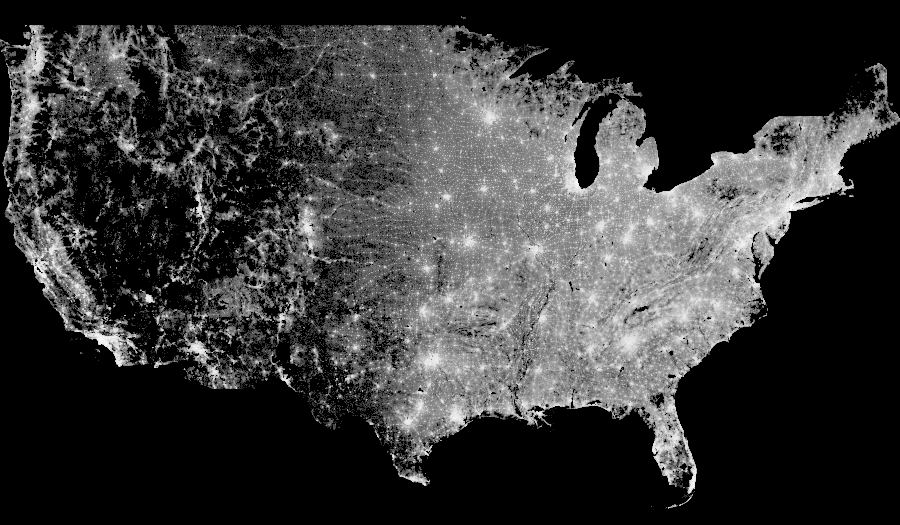

In [11]:
export(tf.shade(agg, cmap = cm(Greys9, 0.2), how='log'),"census_gray_linear")

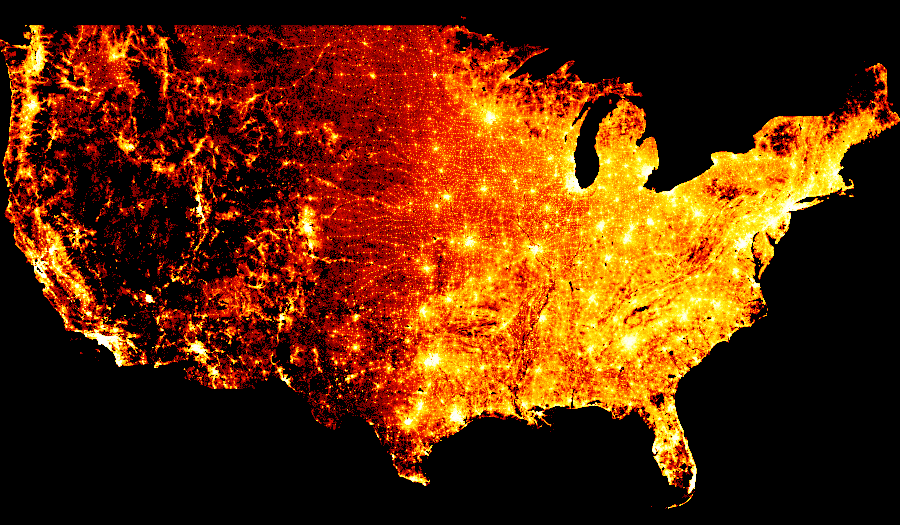

In [12]:
from colorcet import fire
export(tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist'),"census_ds_fire_eq_hist")

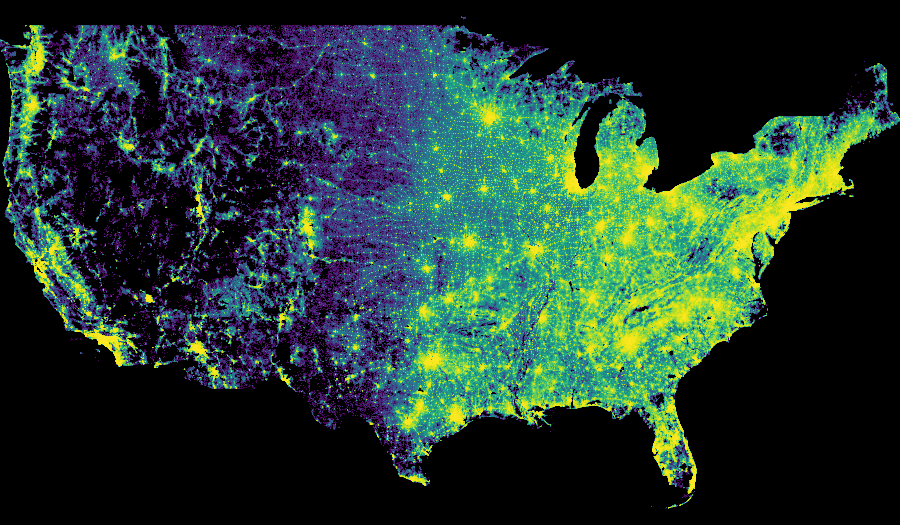

In [13]:
from datashader.colors import viridis
export(tf.shade(agg, cmap=cm(viridis), how='eq_hist'),"census_viridis_eq_hist")

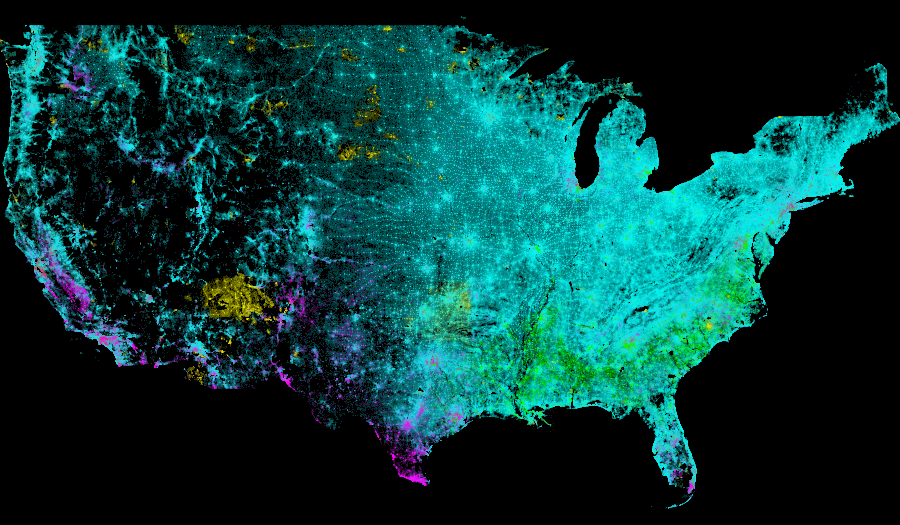

In [15]:
if background == "black":
      color_key = {'w':'aqua', 'b':'lime',  'a':'red', 'h':'fuchsia', 'o':'yellow' }
else: color_key = {'w':'blue', 'b':'green', 'a':'red', 'h':'orange',  'o':'saddlebrown'}
def create_image(longitude_range, latitude_range, w=plot_width, h=plot_height):
    x_range,y_range=webm(longitude_range,latitude_range)
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'easting', 'northing', ds.count_cat('race'))
    img = tf.shade(agg, color_key=color_key, how='eq_hist')
    return img

export(create_image(*USA),"Zoom 0 - USA")

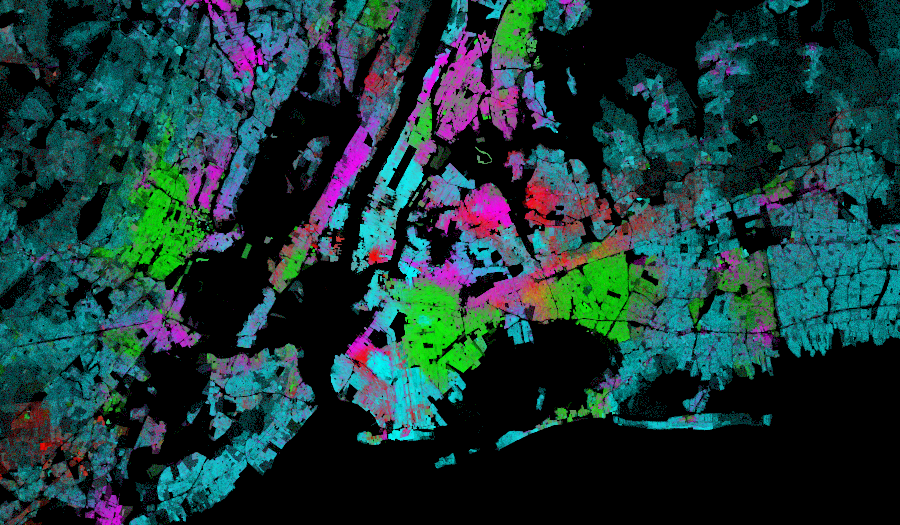

In [16]:
export(create_image(*NewYorkCity),"NYC")

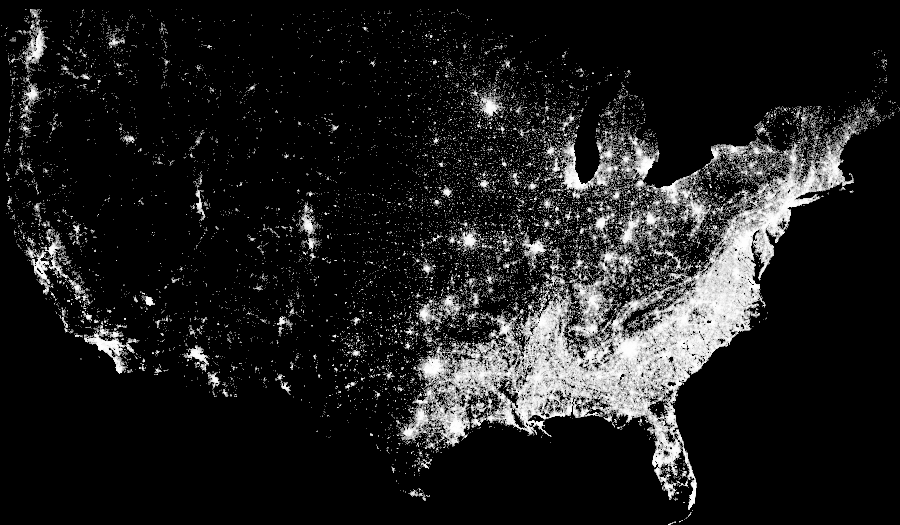

In [17]:
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height)
aggc = cvs.points(df, 'easting', 'northing', ds.count_cat('race'))

export(tf.shade(aggc.sel(race='b'), cmap=cm(Greys9,0.25), how='eq_hist'),"USA blacks")

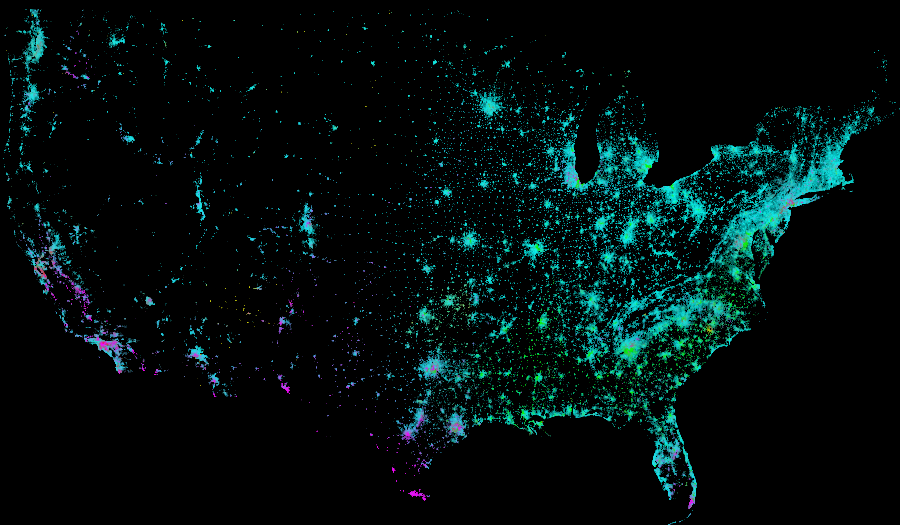

In [18]:
agg2 = aggc.where((aggc.sel(race=['w', 'b', 'a', 'h']) > 0).all(dim='race')).fillna(0)
export(tf.shade(agg2, color_key=color_key, how='eq_hist'),"USA all")

## NYC Crime

In [170]:
# https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Historic/qgea-i56i
import pandas as pd
df = pd.read_csv('/Users/datalab/bigdata/NYPD_Complaint_Data_Historic.csv', #nrows = 1000, 
                usecols= ['Latitude', 'Longitude', 'SUSP_SEX', 'SUSP_RACE', 'OFNS_DESC'])
df.head()

,OFNS_DESC,SUSP_RACE,SUSP_SEX,Latitude,Longitude
0,PETIT LARCENY,NaN,NaN,40.616758,-73.963143
1,ROBBERY,WHITE HISPANIC,M,40.747944,-73.854781
2,HARRASSMENT 2,BLACK,U,40.576995,-73.981524
3,DANGEROUS DRUGS,WHITE,M,40.607195,-74.148564
4,GRAND LARCENY,UNKNOWN,M,40.802294,-73.945280


In [171]:
from datashader.utils import lnglat_to_meters as webm

df['Lon'], df['Lat'] = webm(df['Longitude'].tolist(), df['Latitude'].tolist())

In [119]:
df.head()

,OFNS_DESC,SUSP_RACE,SUSP_SEX,Latitude,Longitude,Lon,Lat
0,PETIT LARCENY,NaN,NaN,40.616758,-73.963143,-8.233539e+06,4.955977e+06
1,ROBBERY,WHITE HISPANIC,M,40.747944,-73.854781,-8.221477e+06,4.975234e+06
2,HARRASSMENT 2,BLACK,U,40.576995,-73.981524,-8.235586e+06,4.950147e+06
3,DANGEROUS DRUGS,WHITE,M,40.607195,-74.148564,-8.254180e+06,4.954575e+06
4,GRAND LARCENY,UNKNOWN,M,40.802294,-73.945280,-8.231551e+06,4.983224e+06


In [18]:
df.columns

Index(['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'ADDR_PCT_CD', 'RPT_DT', 'KY_CD', 'OFNS_DESC', 'PD_CD',
       'PD_DESC', 'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'BORO_NM',
       'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'JURIS_DESC', 'JURISDICTION_CODE',
       'PARKS_NM', 'HADEVELOPT', 'HOUSING_PSA', 'X_COORD_CD', 'Y_COORD_CD',
       'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX', 'TRANSIT_DISTRICT',
       'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO', 'STATION_NAME',
       'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX'],
      dtype='object')

In [104]:
df.head()

,OFNS_DESC,SUSP_RACE,SUSP_SEX,Latitude,Longitude,Lon,Lat
0,PETIT LARCENY,NaN,NaN,40.616758,-73.963143,-8.233539e+06,4.955977e+06
1,ROBBERY,WHITE HISPANIC,M,40.747944,-73.854781,-8.221477e+06,4.975234e+06
2,HARRASSMENT 2,BLACK,U,40.576995,-73.981524,-8.235586e+06,4.950147e+06
3,DANGEROUS DRUGS,WHITE,M,40.607195,-74.148564,-8.254180e+06,4.954575e+06
4,GRAND LARCENY,UNKNOWN,M,40.802294,-73.945280,-8.231551e+06,4.983224e+06


In [38]:
df.groupby('SUSP_SEX').size()

SUSP_SEX
F     576490
M    1784627
U     438633
dtype: int64

In [39]:
df.groupby('SUSP_RACE').size()

SUSP_RACE
AMERICAN INDIAN/ALASKAN NATIVE       9036
ASIAN / PACIFIC ISLANDER            89136
BLACK                             1093935
BLACK HISPANIC                     149002
OTHER                                  11
UNKNOWN                            764617
WHITE                              330730
WHITE HISPANIC                     496597
dtype: int64

In [172]:
import datashader as ds
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, inferno
import datashader.transfer_functions as tf

In [173]:
# http://datashader.org/topics/census.html
# Initial datashader / visualization configuration
background = 'black'
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))
# Create a color key for VIOLATION, MISDEMEANOR, and FELONY
# color_key = {'F':'white', 'M':'yellow',  'U':'red'}
# Convert OFFENSE_LEVEL column to type 'category'
# df['SUSP_SEX'] = df['SUSP_SEX'].astype('category')
# Create function to re-generate canvas, grid, and map based on data category provided
from datashader.utils import lnglat_to_meters as webm

NewYorkCity   = (( -74.39,  -73.44), (40.51, 40.91))
x_range,y_range = [list(r) for r in webm(*NewYorkCity)]

plot_width  = int(900)
plot_height = int(plot_width*7.0/12)

cvs = ds.Canvas(plot_width, plot_height, *webm(*NewYorkCity))
agg = cvs.points(df, 'Lon', 'Lat')#, ds.count_cat('SUSP_SEX'))

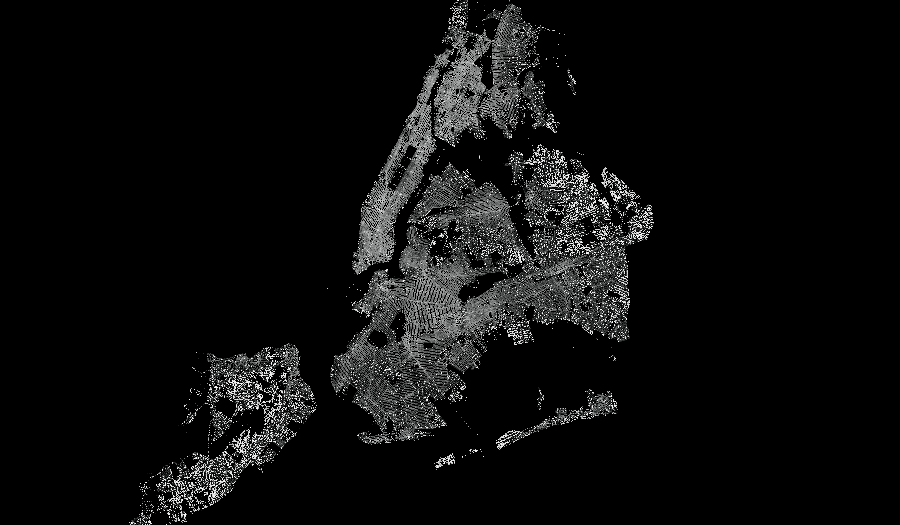

In [176]:
export(tf.shade(agg, cmap = cm(Greys9,0.25), how='log'),"census_gray_linear")*2


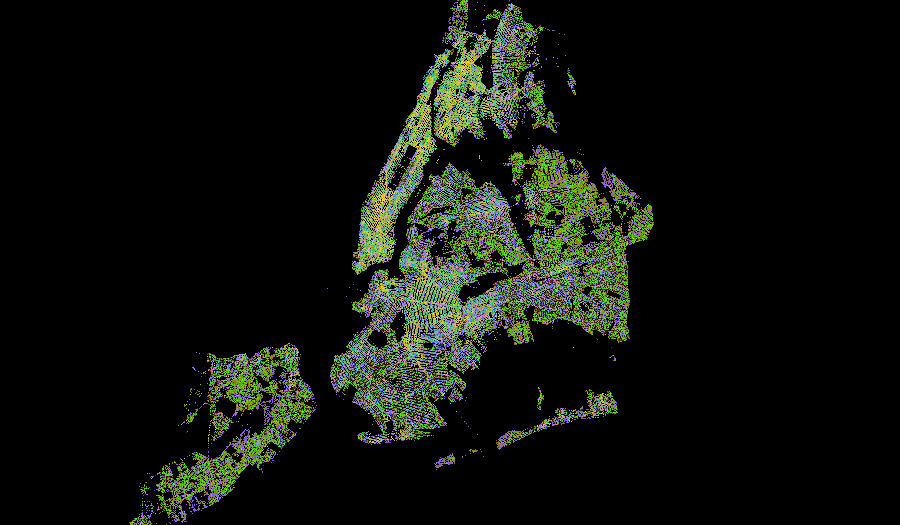

In [178]:
from datashader.colors import viridis

# Show map with 'viridis' color map
export(tf.shade(agg, cmap = cm(viridis, 0.1), how = 'eq_hist'), "export")*2

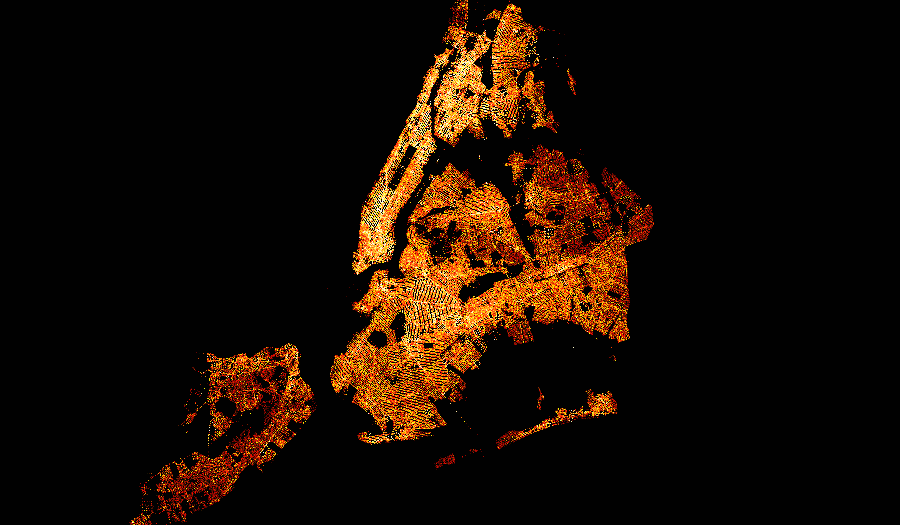

In [179]:
from colorcet import fire
export(tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist'),"census_ds_fire_eq_hist")*3

# END

This is the end.